# 1. Project Description

**In this project, I will be working on intel images i.e. images of buildings,forest,street,etc. This is a multi class classification problem.**

# 2. Importing Libraries

In [127]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sn
%matplotlib inline
from matplotlib.image import imread
import cv2
import random
from os import listdir
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import classification_report

from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array,array_to_img
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation,Flatten, Dense, Dropout, LeakyReLU
from tensorflow.math import confusion_matrix
from tensorflow.keras import callbacks
from tensorflow.keras.models import load_model

### Showing the path 

In [128]:
path=listdir('/kaggle/input/intel-image-dataset/buildings')

path

['22735.jpg',
 '22706.jpg',
 '20777.jpg',
 '23220.jpg',
 '21232.jpg',
 '20874.jpg',
 '24083.jpg',
 '23776.jpg',
 '22860.jpg',
 '20061.jpg',
 '21706.jpg',
 '23527.jpg',
 '24258.jpg',
 '20436.jpg',
 '23854.jpg',
 '22267.jpg',
 '21319.jpg',
 '21841.jpg',
 '21680.jpg',
 '23009.jpg',
 '20637.jpg',
 '20096.jpg',
 '24053.jpg',
 '22410.jpg',
 '20733.jpg',
 '22227.jpg',
 '21501.jpg',
 '21386.jpg',
 '22296.jpg',
 '22462.jpg',
 '20981.jpg',
 '23726.jpg',
 '20246.jpg',
 '21066.jpg',
 '20425.jpg',
 '21580.jpg',
 '20546.jpg',
 '21233.jpg',
 '20580.jpg',
 '20294.jpg',
 '20646.jpg',
 '20228.jpg',
 '23359.jpg',
 '21309.jpg',
 '23297.jpg',
 '22911.jpg',
 '21182.jpg',
 '21243.jpg',
 '22784.jpg',
 '21387.jpg',
 '21367.jpg',
 '23385.jpg',
 '22995.jpg',
 '20904.jpg',
 '22255.jpg',
 '24010.jpg',
 '24197.jpg',
 '23012.jpg',
 '21158.jpg',
 '20515.jpg',
 '22448.jpg',
 '23604.jpg',
 '22076.jpg',
 '21294.jpg',
 '22257.jpg',
 '23908.jpg',
 '20431.jpg',
 '23304.jpg',
 '22759.jpg',
 '22534.jpg',
 '20574.jpg',
 '2340

# 3. Visualize Intel Classes

## a) Buildings

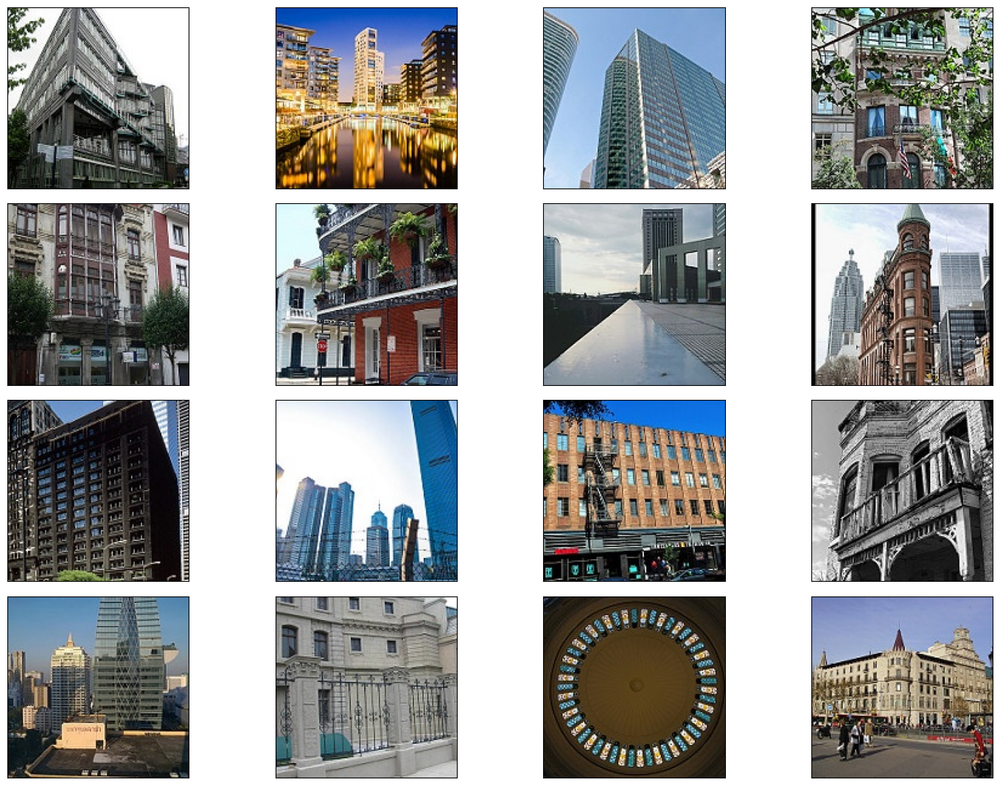

In [129]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/kaggle/input/intel-image-dataset/buildings'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

**Shape**

In [130]:
print(f"Buildings Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Buildings Images shape is: 150*150 Pixels


## b) Forest

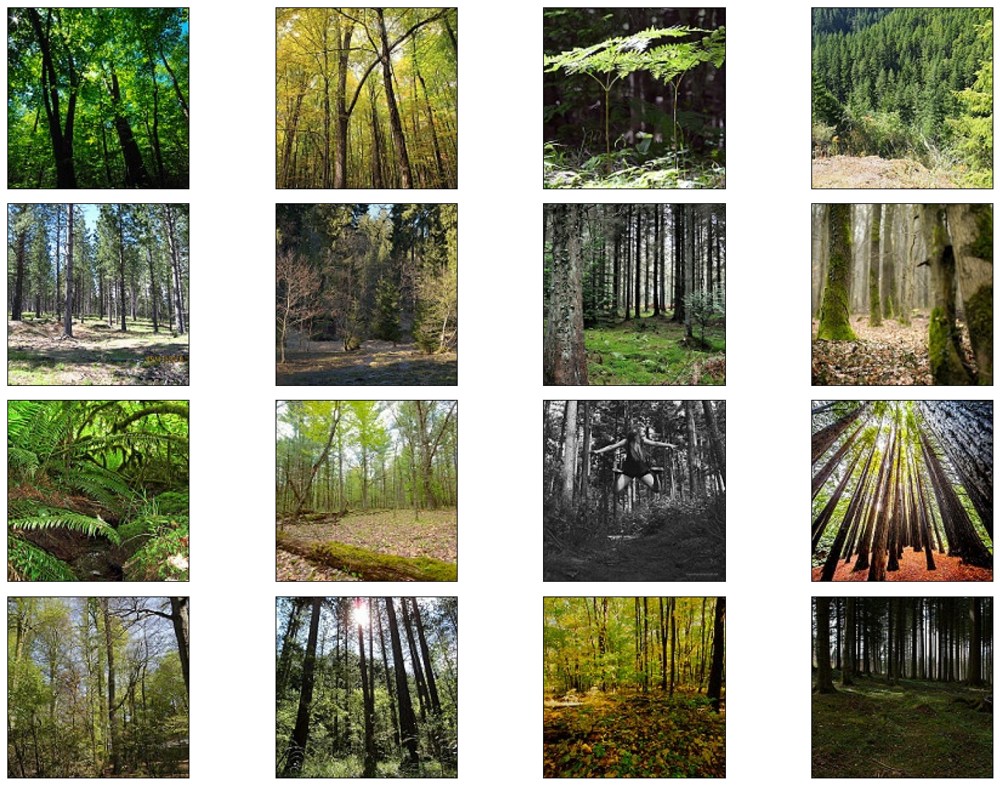

In [131]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/kaggle/input/intel-image-dataset/forest'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

**Shape**

In [132]:
print(f"Forest Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Forest Images shape is: 150*150 Pixels


## c) Glacier

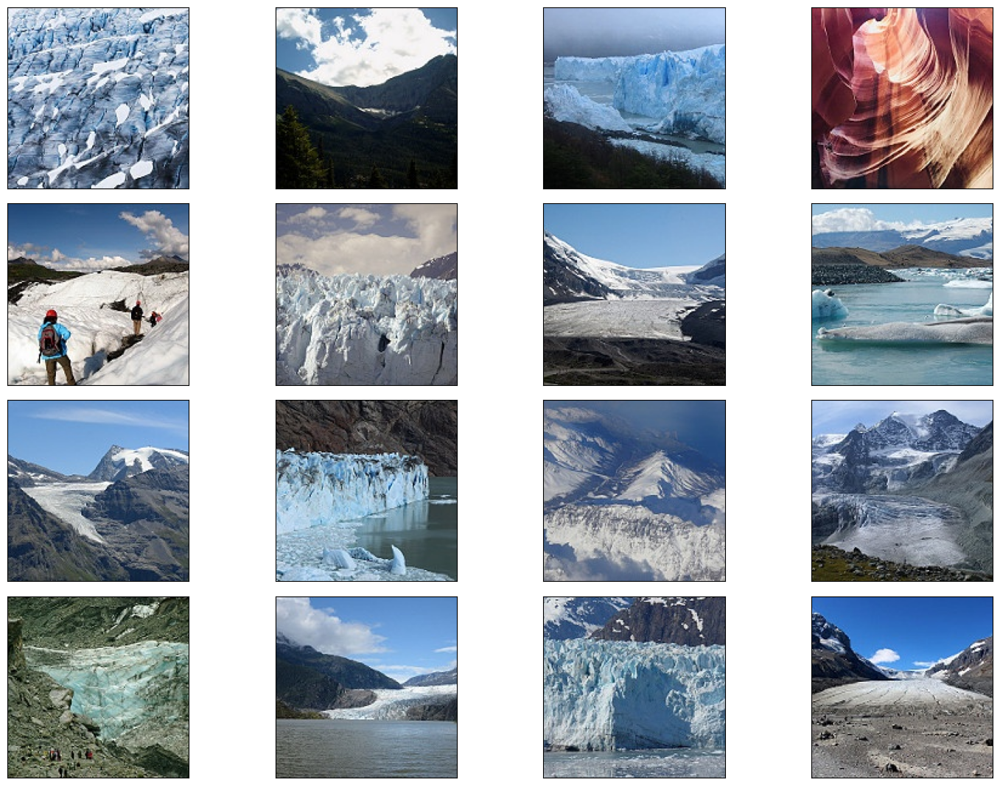

In [133]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/kaggle/input/intel-image-dataset/glacier'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

**Shape**

In [134]:
print(f"Glaciers Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Glaciers Images shape is: 150*150 Pixels


## d) Mountains

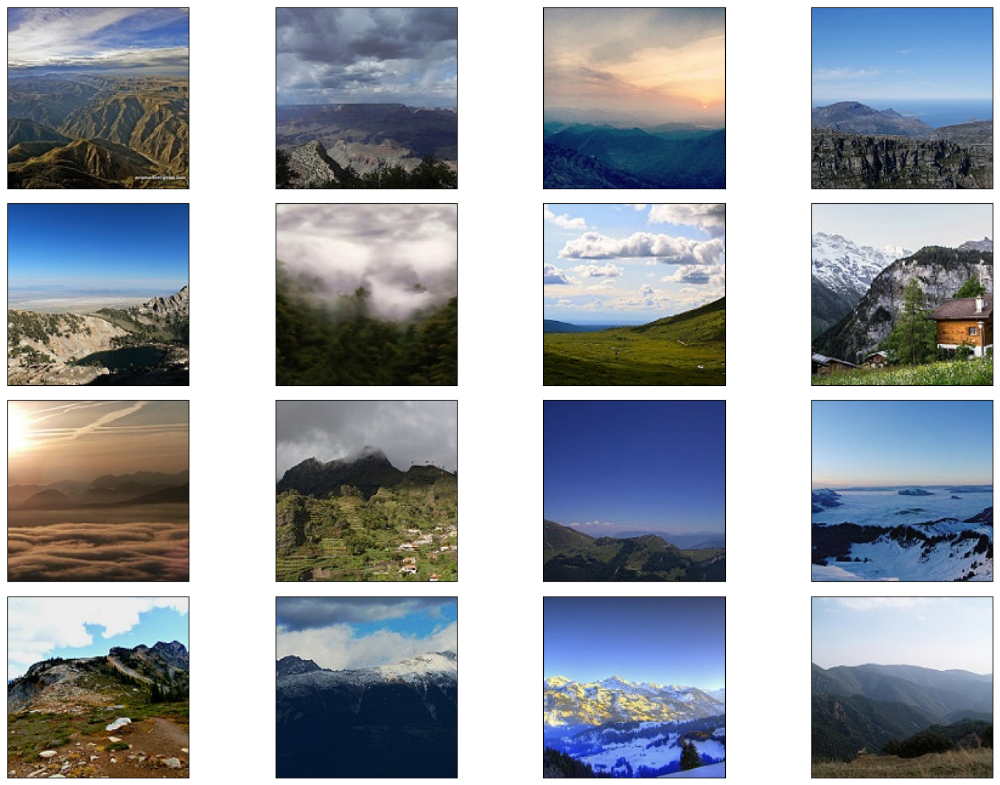

In [135]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/kaggle/input/intel-image-dataset/mountain'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

**Shape**

In [136]:
print(f"Mountains Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Mountains Images shape is: 150*150 Pixels


## e) Sea

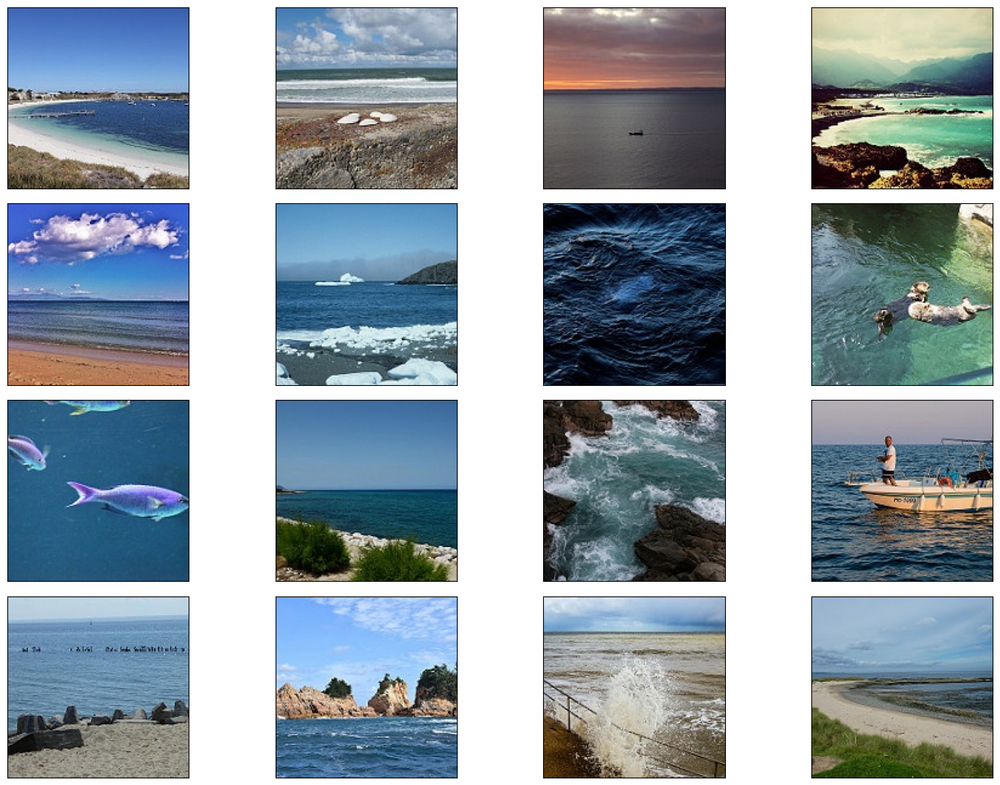

In [137]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/kaggle/input/intel-image-dataset/sea'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

**Shape**

In [138]:
print(f"Sea Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Sea Images shape is: 150*150 Pixels


## f) Street

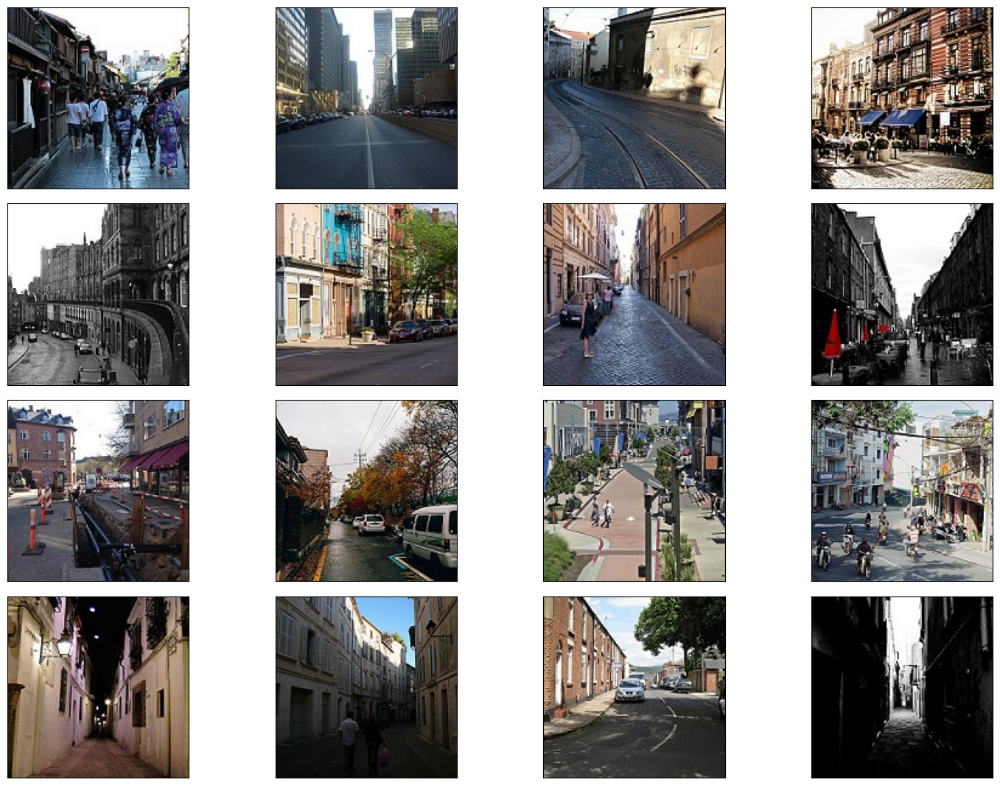

In [139]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/kaggle/input/intel-image-dataset/street'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

**Shape**

In [140]:
print(f"Streets Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Streets Images shape is: 150*150 Pixels


--------------------------------------------------------------------------------------------------------

# 3. Data Preprocessing

### a) Setting root directory and creating empty list

In [141]:
dir="/kaggle/input/intel-image-dataset"
root_dir=listdir(dir)
image_list, label_list=[], []

In [142]:
root_dir

['mountain', 'street', 'buildings', 'sea', 'forest', 'glacier']

### b) Reading and Converting image to numpy array

In [143]:
for directory in root_dir:
    for files in listdir(f"{dir}/{directory}"):
        image_path=f"{dir}/{directory}/{files}"
        
        image=Image.open(image_path)
        image=image.resize((150,150))
        image=img_to_array(image)
        image_list.append(image)
        label_list.append(directory)

### c) Showing the first image

In [144]:
image_list[0]

array([[[130., 145., 186.],
        [131., 146., 187.],
        [132., 147., 188.],
        ...,
        [118., 140., 189.],
        [120., 142., 191.],
        [121., 143., 192.]],

       [[131., 146., 187.],
        [131., 146., 187.],
        [133., 148., 189.],
        ...,
        [118., 140., 189.],
        [120., 142., 191.],
        [121., 143., 192.]],

       [[130., 145., 186.],
        [131., 146., 187.],
        [130., 148., 188.],
        ...,
        [120., 142., 191.],
        [119., 141., 190.],
        [119., 141., 190.]],

       ...,

       [[ 77.,  74.,  41.],
        [ 25.,  23.,   0.],
        [100.,  97.,  56.],
        ...,
        [ 79.,  75.,  37.],
        [ 87.,  84.,  43.],
        [ 84.,  81.,  40.]],

       [[ 43.,  42.,  11.],
        [ 57.,  54.,  19.],
        [ 84.,  81.,  40.],
        ...,
        [ 74.,  69.,  29.],
        [112., 107.,  67.],
        [ 78.,  73.,  33.]],

       [[ 26.,  25.,   0.],
        [ 72.,  72.,  36.],
        [ 93.,  

### d) Counting the number of images

In [145]:
print(f"Our data contains {len(image_list)} images with different classes")

Our data contains 3000 images with different classes


# 4. Labeled List analysis

In [146]:
label_counts=pd.DataFrame(label_list).value_counts()
label_counts

0        
glacier      553
mountain     525
sea          510
street       501
forest       474
buildings    437
Name: count, dtype: int64

## Visualizaton using pie-chart

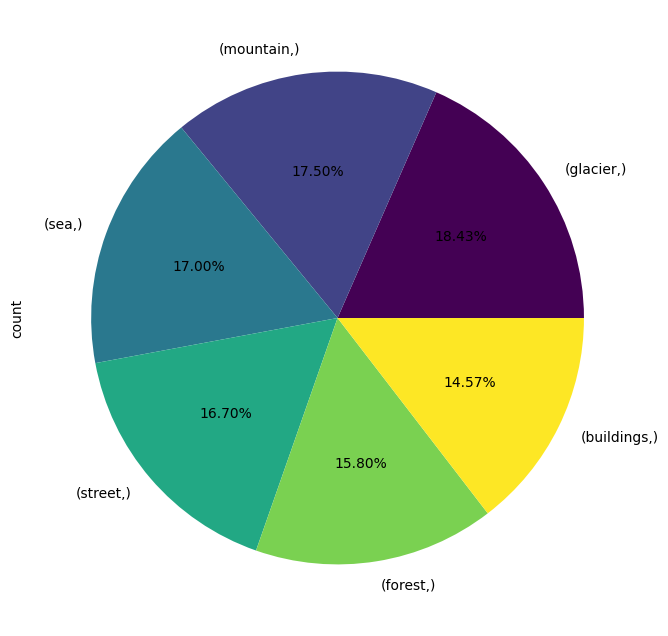

In [147]:
cmap = plt.get_cmap('viridis')

colors = cmap(np.linspace(0, 1, len(label_counts)))

plt.figure(figsize=(10,8))
label_counts.plot(kind='pie', autopct="%1.2f%%", colors=colors)
plt.show()

### Showinhg the number of classes

In [148]:
num_classes=len(label_counts)

num_classes

6

In [149]:
np.array(image_list).shape

(3000, 150, 150, 3)

### Checking y data shape

In [150]:
label_list=np.array(label_list)
label_list.shape

(3000,)

# 5. Splitting the data into Training and Testing

In [151]:
X_train,X_test,Y_train,Y_test=train_test_split(image_list, label_list, test_size=0.2, random_state=10)

In [152]:
print(f"Number of Training dataset: {len(X_train)}")
print(f"Number of Testing dataset: {len(X_test)}")

Number of Training dataset: 2400
Number of Testing dataset: 600


# 6. Normalization

### Normalize and reshape the data

In [153]:
X_train=np.array(X_train, dtype=np.float16)/ 255.0
X_test=np.array(X_test, dtype=np.float16)/ 255.0

X_train=X_train.reshape(-1, 150,150,3)
X_test=X_test.reshape(-1, 150,150,3)

### Showing the X_train, after reshaping it

In [154]:
X_train[0]

array([[[0.7295, 0.8   , 0.8   ],
        [0.7295, 0.8   , 0.8   ],
        [0.7295, 0.8   , 0.8   ],
        ...,
        [0.792 , 0.851 , 0.8394],
        [0.792 , 0.851 , 0.8394],
        [0.792 , 0.851 , 0.8394]],

       [[0.7295, 0.8   , 0.8   ],
        [0.7295, 0.8   , 0.8   ],
        [0.7295, 0.8   , 0.8   ],
        ...,
        [0.788 , 0.847 , 0.8354],
        [0.788 , 0.847 , 0.8354],
        [0.788 , 0.847 , 0.8354]],

       [[0.7334, 0.8037, 0.8037],
        [0.7334, 0.8037, 0.8037],
        [0.7334, 0.8037, 0.8037],
        ...,
        [0.784 , 0.8433, 0.8315],
        [0.788 , 0.847 , 0.8354],
        [0.788 , 0.847 , 0.8354]],

       ...,

       [[0.1686, 0.1726, 0.149 ],
        [0.2079, 0.2118, 0.1882],
        [0.1765, 0.1882, 0.1608],
        ...,
        [0.1608, 0.1882, 0.1569],
        [0.1726, 0.2   , 0.1726],
        [0.1569, 0.1843, 0.1569]],

       [[0.1686, 0.1726, 0.149 ],
        [0.2235, 0.2274, 0.204 ],
        [0.1843, 0.196 , 0.1686],
        .

# 7. Label Binarizing

In [155]:
lb=LabelBinarizer()
Y_train=lb.fit_transform(Y_train)
Y_test=lb.fit_transform(Y_test)

print(lb.classes_)

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']


In [156]:
Y_train[0]

array([0, 0, 1, 0, 0, 0])

# 8. Splitting the Training data into Train and Validation data

In [157]:
# Training data 80% and validation data 20%
X_train,X_val, Y_train,Y_val=train_test_split(X_train, Y_train, test_size=0.2)

In [158]:
print(f"Number of Training dataset: {len(X_train)}\nNumber of Testing dataset: {len(X_test)}\nNumber of Validation dataset: {len(X_val)}")

Number of Training dataset: 1920
Number of Testing dataset: 600
Number of Validation dataset: 480


# 9. Model Training

## i) ANN

### a) Model building and compile

In [159]:
def load_model():
    model=Sequential([
        Flatten(input_shape=(150,150,3)),
        Dense(512, activation='relu'),
        Dense(256, activation='relu'),
        Dense(128, activation='relu'),
        Dense(num_classes, activation='softmax'),
    ])
    
    model.compile(
    optimizer=Adam(learning_rate=0.0005),
        loss='categorical_crossentropy',
        metrics=['acc'],
    )
    return model

### b) Prone to overfit

In [160]:
early_stopping=callbacks.EarlyStopping(
    patience=10,
    min_delta=0,
    monitor='val_loss',
    restore_best_weights=True,
    verbose=0,
    mode='min',
    baseline=None,
)

plateau=callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=4,
    verbose=0,
    mode='min'
)

### c) Model Training

In [161]:
ann_model=load_model()

history_ann=ann_model.fit(X_train,Y_train, validation_data=(X_val, Y_val), epochs=1000, callbacks=[early_stopping, plateau])

Epoch 1/1000
60/60 [==============================] - 3s 26ms/step - loss: 4.8907 - acc: 0.2922 - val_loss: 1.7300 - val_acc: 0.3688 - lr: 5.0000e-04
Epoch 2/1000
60/60 [==============================] - 1s 12ms/step - loss: 1.8607 - acc: 0.4161 - val_loss: 1.8339 - val_acc: 0.3979 - lr: 5.0000e-04
Epoch 3/1000
60/60 [==============================] - 1s 11ms/step - loss: 1.7975 - acc: 0.4339 - val_loss: 1.8346 - val_acc: 0.4375 - lr: 5.0000e-04
Epoch 4/1000
60/60 [==============================] - 1s 14ms/step - loss: 1.5619 - acc: 0.4938 - val_loss: 1.6959 - val_acc: 0.3812 - lr: 5.0000e-04
Epoch 5/1000
60/60 [==============================] - 1s 14ms/step - loss: 1.3279 - acc: 0.5417 - val_loss: 1.6288 - val_acc: 0.4500 - lr: 5.0000e-04
Epoch 6/1000
60/60 [==============================] - 1s 11ms/step - loss: 1.2955 - acc: 0.5312 - val_loss: 1.6512 - val_acc: 0.3917 - lr: 5.0000e-04
Epoch 7/1000
60/60 [==============================] - 1s 14ms/step - loss: 1.2094 - acc: 0.5688 - va

### d) Learning Curve

#### i) Loss

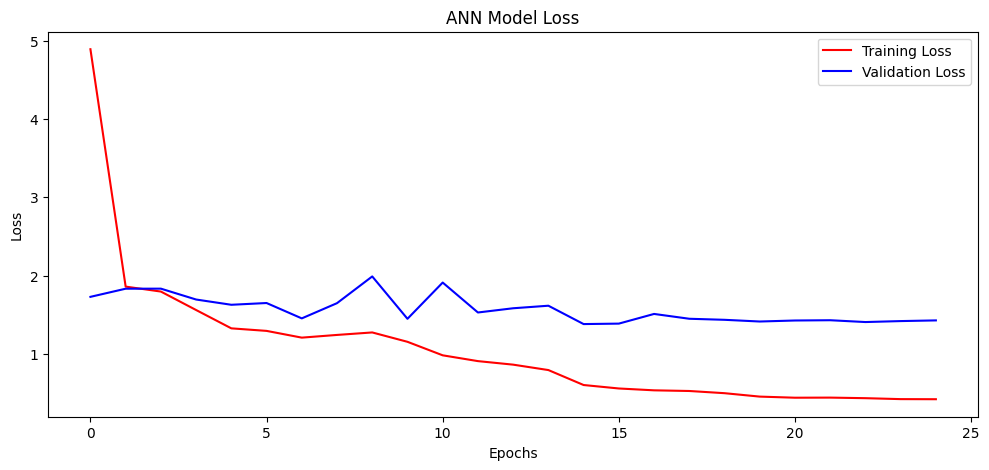

In [162]:
plt.figure(figsize=(12,5))

plt.plot(history_ann.history['loss'], label='Training Loss', color='r')
plt.plot(history_ann.history['val_loss'], label='Validation Loss', color='b')

plt.title("ANN Model Loss")
plt.xlabel('Epochs')
plt.ylabel("Loss")
plt.legend()
plt.show()

#### ii) Accuracy

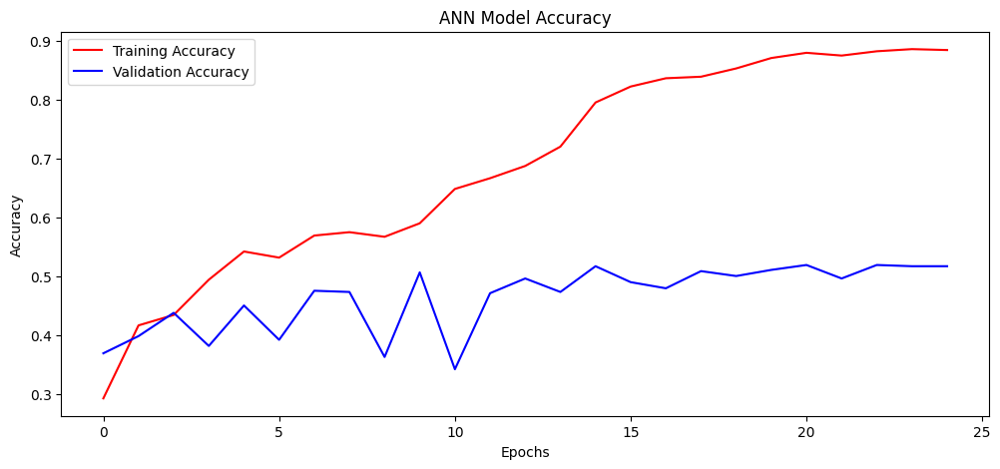

In [163]:
plt.figure(figsize=(12,5))

plt.plot(history_ann.history['acc'], label='Training Accuracy', color='r')
plt.plot(history_ann.history['val_acc'], label='Validation Accuracy', color='b')

plt.title("ANN Model Accuracy")
plt.xlabel('Epochs')
plt.ylabel("Accuracy")
plt.legend()
plt.show()

--------------------------------------------------------------------------------------------------------------------

## ii) CNN

### a) Building

In [164]:
cnn_model=Sequential([
    
    Conv2D(16, kernel_size=(3,3), input_shape=(150,150,3)),
    LeakyReLU(),
    
    Conv2D(32, kernel_size=(3,3)),
    LeakyReLU(),
    MaxPooling2D(5,5),
    
    Conv2D(64, kernel_size=(3,3)),
    LeakyReLU(),
    
    Conv2D(128, kernel_size=(3,3), input_shape=(150,150,3)),
    LeakyReLU(),
    MaxPooling2D(5,5),
    
    Flatten(),
    
    Dense(64),
    Dropout(rate=0.2),
    LeakyReLU(),
    
    Dense(32),
    Dropout(rate=0.2),
    LeakyReLU(),
    
    Dense(16),
    Dropout(rate=0.2),
    LeakyReLU(1),
    
    Dense(num_classes, activation='softmax')
])

cnn_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 16)      448       
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 148, 148, 16)      0         
                                                                 
 conv2d_5 (Conv2D)           (None, 146, 146, 32)      4640      
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 146, 146, 32)      0         
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 29, 29, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 27, 27, 64)        18496     
                                                      

### ii) Compile and train CNN Model

In [165]:
# Compiling the cnn_model
cnn_model.compile(
    optimizer=Adam(learning_rate=0.0005),
        loss='categorical_crossentropy',
        metrics=['acc'])

epochs=1000
batch_size=128

mc=callbacks.ModelCheckpoint('best_model.h5', monitor='val_loss',mode='min',patience=10, save_best_only=True)


## Prune to overfit
early_stopping=callbacks.EarlyStopping(
    patience=10,
    min_delta=0,
    monitor='val_loss',
    restore_best_weights=True,
    verbose=0,
    mode='min',
    baseline=None,
)

plateau=callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=4,
    verbose=0,
    mode='min'
)


# Train the Model
history=cnn_model.fit(X_train, Y_train, batch_size=batch_size,epochs=epochs, validation_data=(X_val,Y_val),
                     callbacks=[early_stopping, plateau, mc])

Epoch 1/1000
15/15 [==============================] - 4s 110ms/step - loss: 1.7239 - acc: 0.2615 - val_loss: 1.4972 - val_acc: 0.3896 - lr: 5.0000e-04
Epoch 2/1000
 2/15 [===>..........................] - ETA: 0s - loss: 1.5713 - acc: 0.3438

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


15/15 [==============================] - 1s 69ms/step - loss: 1.4729 - acc: 0.3995 - val_loss: 1.2988 - val_acc: 0.4708 - lr: 5.0000e-04
Epoch 3/1000
15/15 [==============================] - 1s 69ms/step - loss: 1.3305 - acc: 0.4620 - val_loss: 1.1579 - val_acc: 0.5562 - lr: 5.0000e-04
Epoch 4/1000
15/15 [==============================] - 1s 69ms/step - loss: 1.2245 - acc: 0.5125 - val_loss: 1.0692 - val_acc: 0.6042 - lr: 5.0000e-04
Epoch 5/1000
15/15 [==============================] - 1s 69ms/step - loss: 1.1189 - acc: 0.5745 - val_loss: 0.9493 - val_acc: 0.6333 - lr: 5.0000e-04
Epoch 6/1000
15/15 [==============================] - 1s 64ms/step - loss: 1.0367 - acc: 0.6047 - val_loss: 0.9704 - val_acc: 0.6417 - lr: 5.0000e-04
Epoch 7/1000
15/15 [==============================] - 1s 68ms/step - loss: 0.9694 - acc: 0.6250 - val_loss: 0.8656 - val_acc: 0.6896 - lr: 5.0000e-04
Epoch 8/1000
15/15 [==============================] - 1s 65ms/step - loss: 0.9293 - acc: 0.6323 - val_loss: 0.950

### iii) CNN Model Accuracy on Validation data

In [166]:
cnn_model.evaluate(X_val,Y_val)

15/15 [==============================] - 0s 9ms/step - loss: 0.5772 - acc: 0.8104


[0.5771715641021729, 0.8104166388511658]

### iv) CNN Model Accuracy on Testing data

In [167]:
cnn_model.evaluate(X_test,Y_test)

19/19 [==============================] - 0s 9ms/step - loss: 0.7498 - acc: 0.7750


[0.749790370464325, 0.7749999761581421]

### v) Learning Curve

#### a) Loss

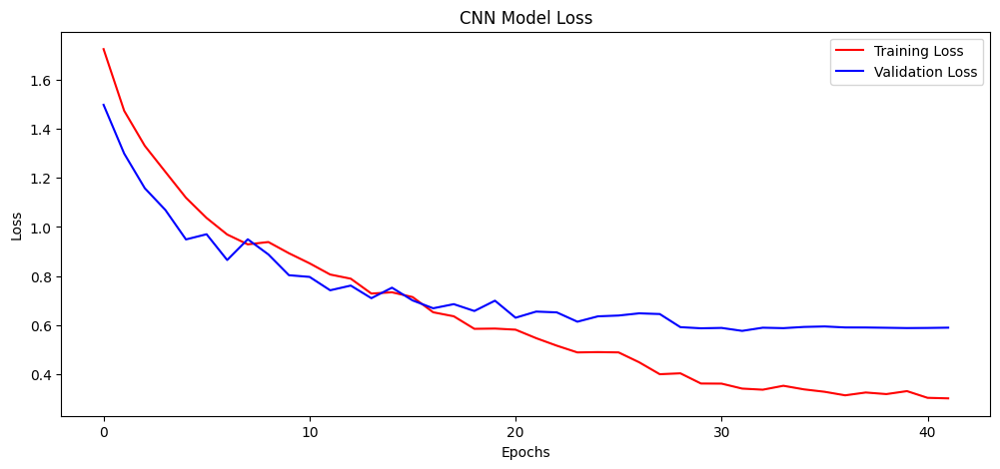

In [168]:
plt.figure(figsize=(12,5))

plt.plot(history.history['loss'], label='Training Loss', color='r')
plt.plot(history.history['val_loss'], label='Validation Loss', color='b')

plt.title("CNN Model Loss")
plt.xlabel('Epochs')
plt.ylabel("Loss")
plt.legend()
plt.show()

#### b) Accuracy

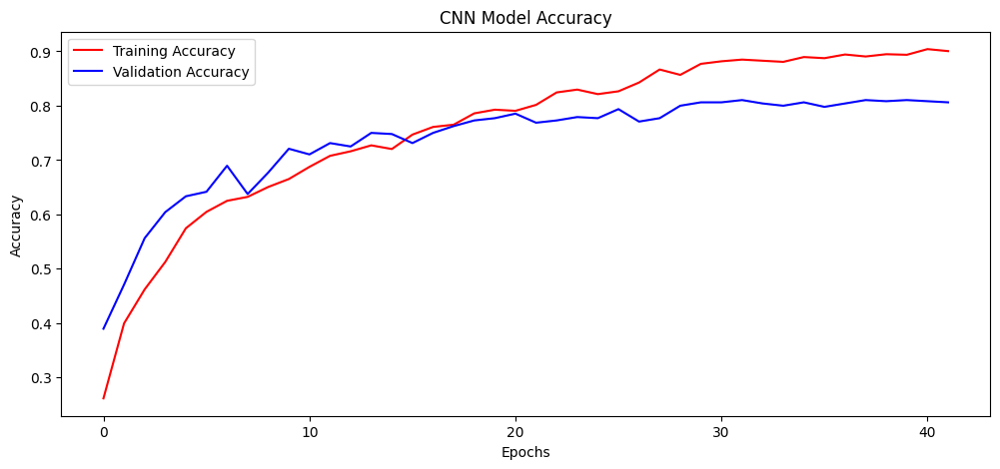

In [169]:
plt.figure(figsize=(12,5))

plt.plot(history.history['acc'], label='Training Accuracy', color='r')
plt.plot(history.history['val_acc'], label='Validation Accuracy', color='b')

plt.title("CNN Model Accuracy")
plt.xlabel('Epochs')
plt.ylabel("Accuracy")
plt.legend()
plt.show()

--------------------------------------------------------------------------------------------------------------------

# 10. Prediction

In [170]:
y_pred=cnn_model.predict(X_test)

19/19 [==============================] - 0s 7ms/step


In [171]:
y_pred

array([[1.5012781e-03, 5.9160782e-04, 2.4198685e-02, 1.7015589e-02,
        9.5640016e-01, 2.9269216e-04],
       [2.7066369e-03, 1.2915123e-02, 6.2231045e-02, 9.1144419e-01,
        9.1185328e-03, 1.5845633e-03],
       [7.1657848e-01, 2.0283225e-03, 3.7902344e-02, 1.5084414e-02,
        2.0411263e-01, 2.4293797e-02],
       ...,
       [1.1835764e-02, 9.0529692e-01, 1.1382684e-02, 1.1008503e-02,
        5.0728150e-02, 9.7479112e-03],
       [2.0999177e-03, 7.1157148e-04, 8.2285470e-01, 4.0690497e-02,
        1.3209119e-01, 1.5520962e-03],
       [4.3348875e-03, 7.5805411e-03, 7.0485607e-02, 2.6784733e-01,
        6.4726901e-01, 2.4825882e-03]], dtype=float32)

In [172]:
y_pred.shape

(600, 6)

Predicted

In [173]:
np.argmax(y_pred[10])

3

Original

In [174]:
np.argmax(Y_test[10])

3

# 11. Evaluation

### a) Plotting the image to compare

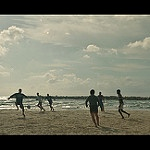

In [175]:
img=array_to_img(X_test[5])
img

### b) Finding max value from prediction list and comparing original valus vs predicted

In [176]:
labels=lb.classes_
print(labels)

print('Originally: ',labels[np.argmax(Y_test[5])])
print('Predicted: ',labels[np.argmax(y_pred[5])])

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']
Originally:  sea
Predicted:  sea


----------

### Example 1

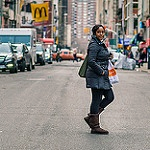

In [180]:
img=array_to_img(X_test[50])
img

In [181]:
labels=lb.classes_
print(labels)

print('Originally: ',labels[np.argmax(Y_test[50])])
print('Predicted: ',labels[np.argmax(y_pred[50])])

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']
Originally:  street
Predicted:  street


---

### Example 2

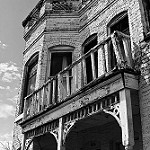

In [201]:
img=array_to_img(X_test[99])
img

In [202]:
labels=lb.classes_
print(labels)

print('Originally: ',labels[np.argmax(Y_test[99])])
print('Predicted: ',labels[np.argmax(y_pred[99])])

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']
Originally:  buildings
Predicted:  buildings


---